## Download and install requisite libraries and packages
---

In [1]:
import sys

!{sys.executable} -m pip install datetime_truncate
!{sys.executable} -m pip install spacy==2.3.7
!{sys.executable} -m pip install pillow==4.1.1
!{sys.executable} -m pip install plotly==4.14.3
!{sys.executable} -m pip install advertools==0.11.1
!{sys.executable} -m pip install psutil requests==2.25.1
!{sys.executable} -m pip install jupyterlab "ipywidgets>=7.5"
!{sys.executable} -m pip install "notebook>=5.3" "ipywidgets>=7.5"

# %reload_ext autoreload
# %autoreload

### Install node js and npm

In [9]:
!conda install anaconda -y
!conda install -c conda-forge nodejs -y

Solving environment: failed with initial frozen solve. Retrying with flexible solve.
Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.8.4
  latest version: 4.10.1

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/ec2-user/anaconda3/envs/python3

  added / updated specs:
    - anaconda


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    aiohttp-3.7.3              |   py36h8f6f2f9_2         629 KB  conda-forge
    anaconda-custom            |           py36_1           3 KB
    astroid-2.5                |   py36h5fab9bb_1         297 KB  conda-forge
    botocore-1.19.52           |     pyhd8ed1ab_0         4.4 MB  conda-forge
    flask-cors-3.0.8           |             py_0          14 KB  conda-forge
    lxml-4.6.2                 |   py36h04a5ba7_1         1.

In [ ]:
!conda update -n base -c defaults conda --force

### JupyterLab renderer support
install the required JupyterLab extensions

In [10]:
!conda install -c plotly plotly-orca=1.3.1 -y

Solving environment: - 
The environment is inconsistent, please check the package plan carefully
The following packages are causing the inconsistency:

  - conda-forge/linux-64::nodejs==15.14.0=h92b4a50_0
done


==> WARNING: A newer version of conda exists. <==
  current version: 4.8.4
  latest version: 4.10.1

Please update conda by running

    $ conda update -n base -c defaults conda



# All requested packages already installed.



In [11]:
!jupyter labextension install jupyterlab-plotly@4.14.3

Config option `kernel_spec_manager_class` not recognized by `InstallLabExtensionApp`.
[W 2021-06-22 07:42:48.032 LabApp] Config option `kernel_spec_manager_class` not recognized by `LabApp`.
Building jupyterlab assets (production, minimized)


In [13]:
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import pandas as pd 
import numpy as np
import sklearn
import os
from datetime_truncate import truncate

## Import and prepare CSV files
---

In [140]:
gps_df = pd.read_csv('data/play_store_reviews.csv')
as_df = pd.read_csv('data/app_store_reviews.csv')
combined_df = pd.read_csv('data/combined_reviews.csv')

# convert date columns to datetime since dtypes aren't preserved in csv files
gps_df['at'] = pd.to_datetime(gps_df['at'])
as_df['date'] = pd.to_datetime(as_df['date'])
combined_df['date'] = pd.to_datetime(combined_df['date'])

In [141]:
# drop unnecessary columns
gps_df = gps_df.drop(['reviewId', 'userName', 'userImage', 'thumbsUpCount', 'reviewCreatedVersion', 'replyContent', 'repliedAt'], axis=1)
gps_df['type'] = 'play store'

gps_df.info()
print(display(gps_df.head(10)))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 110606 entries, 0 to 110605
Data columns (total 4 columns):
 #   Column   Non-Null Count   Dtype         
---  ------   --------------   -----         
 0   content  110597 non-null  object        
 1   score    110606 non-null  int64         
 2   at       110606 non-null  datetime64[ns]
 3   type     110606 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 3.4+ MB


,content,score,at,type
0,Friendly user.,5,2020-08-05 06:23:06,play store
1,nice and easy,5,2021-05-07 12:10:07,play store
2,Amazing gcash,5,2021-04-11 06:13:37,play store
3,Nice apps ever last thing 🔥🔥🔥🔥🔥😍😍😍😍😍😘😘😘😘😘,5,2021-02-26 01:45:39,play store
4,Very convinience,5,2020-08-02 04:48:25,play store
5,wow,5,2020-03-30 03:43:02,play store
6,Excellent,5,2020-10-22 15:58:33,play store
7,Kkkkkkkk,5,2020-10-25 05:57:47,play store
8,Nice,5,2021-03-06 12:42:25,play store
9,vgood,5,2021-04-06 07:14:31,play store


None


In [142]:
as_df = as_df.drop(['title', 'userName', 'isEdited', 'developerResponse'], axis=1)
as_df['type'] = 'app store'

as_df.info()
print(display(as_df.head(10)))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1669 entries, 0 to 1668
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   date    1669 non-null   datetime64[ns]
 1   review  1669 non-null   object        
 2   rating  1669 non-null   int64         
 3   type    1669 non-null   object        
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 52.3+ KB


,date,review,rating,type
0,2021-02-17 06:32:13,Nakakadismaya naman. Dati okay naman yung gcas...,1,app store
1,2020-03-24 03:28:48,Don’t ever put your money here! My transaction...,1,app store
2,2020-09-15 16:58:57,Best as it has no fees. Wish they had rebates ...,5,app store
3,2020-06-07 09:31:21,Gcash has been very helpful in many ways to me...,1,app store
4,2020-09-25 09:19:47,I USED METROBANK INSTAPAY TO CASH IN BUT UNTIL...,1,app store
5,2021-01-31 02:22:08,My account was charged without the transaction...,1,app store
6,2020-07-22 08:00:54,you've alway have deductions everytime we have...,1,app store
7,2020-04-20 19:30:59,So the first time I used this app they ask me ...,1,app store
8,2020-06-16 13:13:06,please fix this problem for the first time use...,1,app store
9,2020-12-09 06:42:52,I sent wrong number pls help me to refund my m...,5,app store


None


In [143]:
# init empty DF
combined_df = pd.DataFrame()

# populate lists
date_lst = gps_df['at'].values.tolist() + as_df['date'].values.tolist()
review_lst = gps_df['content'].values.tolist() + as_df['review'].values.tolist()
rating_lst = gps_df['score'].values.tolist() + as_df['rating'].values.tolist()
type_lst = gps_df['type'].values.tolist() + as_df['type'].values.tolist()

# populate DF
combined_df['date'] = date_lst
combined_df['date'] = pd.to_datetime(combined_df['date'])
combined_df['review'] = review_lst
combined_df['rating'] = rating_lst
combined_df['type'] = type_lst

# shuffle rows
combined_df = combined_df.sample(frac=1).reset_index(drop=True)

# drop rows that have NULL entries
combined_df = combined_df.dropna()

# drop rows that have duplicates
combined_df = combined_df.drop_duplicates()

combined_df.info()
print(display(combined_df.head(10)))

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112264 entries, 0 to 112274
Data columns (total 4 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    112264 non-null  datetime64[ns]
 1   review  112264 non-null  object        
 2   rating  112264 non-null  int64         
 3   type    112264 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(2)
memory usage: 4.3+ MB


,date,review,rating,type
0,2021-05-07 02:19:38,I recommend Gcash Mod Apk,5,play store
1,2021-04-15 11:54:46,Very Nice,5,play store
2,2021-05-10 07:52:13,Its good to use,5,play store
3,2020-07-24 03:29:53,"Can you fix the bug or something , when I get ...",5,play store
4,2021-01-04 03:41:12,Hassle not accepting TIN id for verification!!!,1,play store
5,2020-10-23 04:35:36,Awesome,5,play store
6,2021-01-07 07:12:55,Good,5,play store
7,2021-04-12 00:41:42,THANK YOU GLOBE AT SA WAKAS BIOMETERICS NA DIN...,1,play store
8,2020-01-18 17:57:39,Its very usefull i can pay bill with this app,5,play store
9,2020-11-24 18:09:23,Nice,5,play store


None


### Export combined_df as CSV

In [21]:
combined_df.to_csv('data/combined_reviews.csv', index=False)

In [7]:
combined_df = pd.read_csv('data/combined_reviews.csv')

# convert date columns to datetime since dtypes aren't preserved in csv files
combined_df['date'] = pd.to_datetime(combined_df['date'])

# create and append month column
combined_df['month'] = combined_df['date'].apply(lambda x: truncate(x, 'month').date())
combined_df['month'] = pd.to_datetime(combined_df['month'])

combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112264 entries, 0 to 112263
Data columns (total 5 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    112264 non-null  datetime64[ns]
 1   review  112264 non-null  object        
 2   rating  112264 non-null  int64         
 3   type    112264 non-null  object        
 4   month   112264 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(2)
memory usage: 4.3+ MB


## Exploratory Data Analysis
---

In [14]:
import plotly.io as pio
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# set default renderer
pio.renderers.default = "jupyterlab"

# disable false positive warning
pd.options.mode.chained_assignment = None  # default='warn'

ax_1 = combined_df.loc[(combined_df['type'] == 'play store') & (combined_df['rating'] == 1)]
ax_5 = combined_df.loc[(combined_df['type'] == 'play store') & (combined_df['rating'] == 5)]
ax_1 = ax_1.sort_values(by=['date'])
ax_5 = ax_5.sort_values(by=['date'])
ax_1['cumsum'] = ax_1['rating'].eq(1).cumsum()
ax_5['cumsum'] = ax_5['rating'].eq(5).cumsum()
ax_1_ratings = ax_1.groupby(['month', 'rating'])['review'].count().reset_index()
ax_5_ratings = ax_5.groupby(['month', 'rating'])['review'].count().reset_index()

bx_1 = combined_df.loc[(combined_df['type'] == 'app store') & (combined_df['rating'] == 1)]
bx_5 = combined_df.loc[(combined_df['type'] == 'app store') & (combined_df['rating'] == 5)]
bx_1 = bx_1.sort_values(by=['date'])
bx_5 = bx_5.sort_values(by=['date'])
bx_1['cumsum'] = bx_1['rating'].eq(1).cumsum()
bx_5['cumsum'] = bx_5['rating'].eq(5).cumsum()
bx_1_ratings = bx_1.groupby(['month', 'rating'])['review'].count().reset_index()
bx_5_ratings = bx_5.groupby(['month', 'rating'])['review'].count().reset_index()

fig = make_subplots(
    rows=3, 
    cols=2, 
    shared_xaxes=True,
    vertical_spacing=0.05,
    subplot_titles=("Play Store Review Count Over Time (01/2020 - 06/2021)", "App Store Review Count Over Time (01/2020 - 06/2021)")
)

# Play Store
fig.add_trace(
    go.Scatter(
        x=ax_1['date'],
        y=ax_1['cumsum'],
        name='1-star Play Store',
        marker=dict(color='#4c84ed')
    ),
    row=1, 
    col=1
)
fig.add_trace(
    go.Histogram(
        x=ax_1['date'],
        y=ax_1['rating'],
        name='1-star Play Store',
        marker=dict(color='#4c84ed')
    ),
    row=2, 
    col=1
)
fig.add_trace(
    go.Scatter(
        x=ax_1_ratings['month'],
        y=ax_1_ratings['review'],
        name='1-star App Store',
        marker=dict(color='#4c84ed')
    ),
    row=3, 
    col=1
)
fig.add_trace(
    go.Scatter(
        x=ax_5['date'],
        y=ax_5['cumsum'],
        name='5-star Play Store',
        marker=dict(color='#ed4c4c')
    ),
    row=1, 
    col=1
)
fig.add_trace(
    go.Histogram(
        x=ax_5['date'],
        y=ax_5['rating'],
        name='5-star Play Store',
        marker=dict(color='#ed4c4c')
    ),
    row=2, 
    col=1
)
fig.add_trace(
    go.Scatter(
        x=ax_5_ratings['month'],
        y=ax_5_ratings['review'],
        name='5-star Play Store',
        marker=dict(color='#ed4c4c')
    ),
    row=3, 
    col=1
)

# App Store
fig.add_trace(
    go.Scatter(
        x=bx_1['date'],
        y=bx_1['cumsum'],
        name='1-star App Store',
        marker=dict(color='#4c84ed')
    ),
    row=1, 
    col=2
)
fig.add_trace(
    go.Histogram(
        x=bx_1['date'],
        y=bx_1['rating'],
        name='1-star App Store',
        marker=dict(color='#4c84ed')
    ),
    row=2, 
    col=2
)
fig.add_trace(
    go.Scatter(
        x=bx_1_ratings['month'],
        y=bx_1_ratings['review'],
        name='1-star App Store',
        marker=dict(color='#4c84ed')
    ),
    row=3, 
    col=2
)
fig.add_trace(
    go.Scatter(
        x=bx_5['date'],
        y=bx_5['cumsum'],
        name='5-star App Store',
        marker=dict(color='#ed4c4c')
    ),
    row=1, 
    col=2
)
fig.add_trace(
    go.Histogram(
        x=bx_5['date'],
        y=bx_5['rating'],
        name='5-star App Store',
        marker=dict(color='#ed4c4c')
    ),
    row=2, 
    col=2
)
fig.add_trace(
    go.Scatter(
        x=bx_5_ratings['month'],
        y=bx_5_ratings['review'],
        name='5-star App Store',
        marker=dict(color='#ed4c4c')
    ),
    row=3, 
    col=2
)

# Update yaxis properties
fig.update_yaxes(title_text="Review Count")
fig.show()

# for graph to persist outside session
fig.show(renderer="png", width=1750, height=800)

ValueError: 
The orca executable is required in order to export figures as static images,
but the executable that was found at '/home/ec2-user/anaconda3/envs/python3/bin/orca'
does not seem to be a valid plotly orca executable. Please refer to the end of
this message for details on what went wrong.

If you haven't installed orca yet, you can do so using conda as follows:

    $ conda install -c plotly plotly-orca

Alternatively, see other installation methods in the orca project README at
https://github.com/plotly/orca

After installation is complete, no further configuration should be needed.

If you have installed orca, then for some reason plotly.py was unable to
locate it. In this case, set the `plotly.io.orca.config.executable`
property to the full path of your orca executable. For example:

    >>> plotly.io.orca.config.executable = '/path/to/orca'

After updating this executable property, try the export operation again.
If it is successful then you may want to save this configuration so that it
will be applied automatically in future sessions. You can do this as follows:

    >>> plotly.io.orca.config.save()

If you're still having trouble, feel free to ask for help on the forums at
https://community.plot.ly/c/api/python

Here is the error that was returned by the command
    $ /home/ec2-user/anaconda3/envs/python3/bin/orca --help

[Return code: 127]
/home/ec2-user/anaconda3/envs/python3/lib/orca_app/orca: error while loading shared libraries: libgdk_pixbuf-2.0.so.0: cannot open shared object file: No such file or directory

Note: When used on Linux, orca requires an X11 display server, but none was
detected. Please install Xvfb and configure plotly.py to run orca using Xvfb
as follows:

    >>> import plotly.io as pio
    >>> pio.orca.config.use_xvfb = True
    
You can save this configuration for use in future sessions as follows:

    >>> pio.orca.config.save() 
    
See https://www.x.org/releases/X11R7.6/doc/man/man1/Xvfb.1.xhtml
for more info on Xvfb


In [ ]:
# init empty DF
cx = pd.DataFrame()

# Collect and store all App Store reviews in a temporary DF
cx = combined_df
cx['Review word count'] = cx['review'].str.count(' ') + 1

fig = px.histogram(
    cx, 
    x='Review word count',
    color='rating',
    labels=['Word count', 'Review count'],
    title='Review Word Count of App Store and Play Store Reviews',
#     barmode='group',
    width=1000, 
    height=500
)
fig.show()

# for graph to persist outside session
# fig.show(renderer="png")

### Play Store

In [ ]:
# init empty DF
ax = pd.DataFrame()

# Collect and store all Play Store reviews in a temporary DF
# ax = combined_df.loc[(combined_df['type'] == 'play store') & (combined_df['date'] >= '2021-04-09 00:00:00') & (combined_df['date'] <= '2021-04-12 00:00:00')]
ax = combined_df.loc[(combined_df['type'] == 'play store')]
ax['Review word count'] = ax['review'].str.count(' ') + 1

fig = px.histogram(
    ax, 
    x='Review word count',
    color='rating',
    labels=['Word count', 'Review count'],
    title='Review Word Count of Play Store Reviews',
    barmode='group',
    width=1000, 
    height=500
)
fig.show()

# for graph to persist outside session
# fig.show(renderer="png")

### App Store

In [ ]:
# init empty DF
bx = pd.DataFrame()

# Collect and store all App Store reviews in a temporary DF
bx = combined_df.loc[(combined_df['type'] == 'app store')]
bx['Review word count'] = bx['review'].str.count(' ') + 1

fig = px.histogram(
    bx, 
    x='Review word count',
    color='rating',
    labels=['Word count', 'Review count'],
    title='Review Word Count of App Store Reviews',
    barmode='group',
    width=1000, 
    height=500
)
fig.show()

# for graph to persist outside session
# fig.show(renderer="png")

## Convert plain text to bag-of-words (BOW)
---

In [15]:
import re
import nltk
import spacy 
import advertools as adv
from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
from spacy.lang.en.stop_words import STOP_WORDS
from nltk.corpus import wordnet, words, stopwords

nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')
nltk.download('averaged_perceptron_tagger')

# concatenate english and tagalog stopwords into one list
stop_words = stopwords.words('english') + list(adv.stopwords['tagalog']) + \
            ['gcash', 'could', 'doe', 'ha', 'might', 'must', 'need', 'sha', 'wa', 'wo', \
             'would', 'di', 'far', 'nag', 'already', 'always', 'app', 'cant', 'dont', 'even', \
             'get', 'issue', 'please', 'say', 'still', 'try', 'use', 'yung', 'day', 'go', 'im', \
             'keep', 'lang', 'like', 'make', 'nyo', 'problem', 'work', 'the', 'to', 'ive', 'naman', \
             'one', 'take', 'fully', 'also', 'amaze', 'app..', 'ca', 'give', 'much', 'okay', 'pag', \
             'po', 'sana', 'star', 'sya', 'thank', 'usefull', 'verry', 'wala', 'want', 'way', 'well', 'wow']

token_pattern = re.compile(r"(?u)\b\w\w+\b")

# Helper function to lemmatize with part of speech (POS) tag
def get_wordnet_pos(word):
    """Map POS tag to first character lemmatize() accepts"""
    tag = nltk.pos_tag([word])[0][1][0].upper()
    tag_dict = {"J": wordnet.ADJ,
                "N": wordnet.NOUN,
                "V": wordnet.VERB,
                "R": wordnet.ADV}

    return tag_dict.get(tag, wordnet.NOUN)

class LemmaTokenizer(object):
    def __init__(self):
        self.wnl = WordNetLemmatizer()
    def __call__(self, doc):
        return [self.wnl.lemmatize(word, get_wordnet_pos(word)) for word in word_tokenize(doc) if len(word) >= 2 and re.match("[a-z].*", word) and re.match(token_pattern, word)]

[nltk_data] Downloading package punkt to /home/ec2-user/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /home/ec2-user/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /home/ec2-user/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!


### Tokenize and lemmatize review data

In [16]:
import time
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import CountVectorizer

main_df = combined_df.loc[(combined_df['type'] == 'app store') & (combined_df['rating'] == 1)]

# split data to training (70%), validation (15%), and test (15%) datasets
train_data, val_data = train_test_split(main_df, train_size=0.7)
train_data, test_data = train_test_split(train_data, train_size=0.7) 

print(train_data.shape)
print(val_data.shape)
print(test_data.shape)

first_batch = train_data.review.values.tolist()
second_batch = val_data.review.values.tolist()
third_batch = test_data.review.values.tolist()

vocab_size = 20

print('\nTokenizing and counting, this may take a few minutes...')
start_time = time.time()
vectorizer = CountVectorizer(
    input='content', 
    analyzer='word', 
    stop_words=stop_words,
    tokenizer=LemmaTokenizer(),
    strip_accents='ascii',
    max_features=vocab_size, 
)

# Learn the vocabulary dictionary from the training data and return document-term matrix
train_vectors = vectorizer.fit_transform(first_batch)
vocab_list = vectorizer.get_feature_names()
removed_words = vectorizer.get_stop_words()

# Extract token counts out of validation and test data using the vocabulary fitted with fit 
val_vectors = vectorizer.transform(second_batch)
test_vectors = vectorizer.transform(third_batch)

print(f'\nRows, vocab length:\n{train_vectors.shape}')
print(f'\nRemoved stop-words:\n{removed_words}')
print('\nVocab size:', len(vocab_list))
print(f'\nVocab list:\n{vocab_list}')
print('\nDone. Time elapsed: {:.2f}s'.format(time.time() - start_time))

(726, 5)
(446, 5)
(312, 5)

Tokenizing and counting, this may take a few minutes...

Rows, vocab length:
(726, 20)

Removed stop-words:
frozenset({'s', "hadn't", 'do', "shouldn't", 'po', 'na', 'say', 'para', 'is', 'bababa', 'lahat', "don't", 'was', 'might', 'way', 'being', 'ginawang', 'keep', 'kaya', 'didn', 'muli', 'pagitan', 'below', 'marami', 'ibig', 'while', 'pagkakaroon', 'himself', 'nagkaroon', 'sabi', 'napaka', 'about', 'aren', 'ilalim', 'sila', 'be', 'here', 'far', 'm', 'has', 'maaari', 'needn', 'cant', 'kanyang', 'niya', 'own', 'minsan', "weren't", 'one', 'hers', 'issue', 'no', 'pababa', 'these', "didn't", 'other', "hasn't", 'same', 'when', 'so', 'it', 'off', 'give', 'tungkol', 'walang', 'wa', 'thank', 'their', 'try', 'hindi', 'tulad', "it's", 'nilang', 'he', 'me', 'couldn', 'pareho', 'app', 'this', 'apat', 'panahon', 'more', 'them', 'ay', 'any', 'day', 'inyong', 'kailanman', 'further', 'as', 'nito', 'kahit', 'been', 'his', 'did', 'that', 'maging', 'pataas', 'pero', 'sino', 't

### Verify results

In [100]:
import random 

value = random.randrange(0, 4)
# value = 0
print(f'index: {value}')
print(f'\noriginal text:\n{as_one_star_df.review.values.tolist()[value]}')
print(f'\nvectorized text:\n{vectors[value].todense()}')

index: 2

original text:
I love that GCash makes a lot of things easy. 
But it worries me that everything about it relies heavily on a phone number that one registration can bot be transferred to a new number in case you need to replace you phone number.

vectorized text:
[[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 0 0 0 0 3 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0
  0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0]]


In [101]:
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

word_counts = pd.DataFrame(
    vectors.toarray(),
    columns=vocab_list
)

word_counts

,able,account,add,agad,anymore,apps,available,back,bank,best,bill,buy,call,card,cash,convenience,convenient,credit,customer,easy,email,encounter,error,especially,every,everything,experience,fast,feature,fee,fix,free,friendly,fund,gcredit,good,great,hassle,help,helpful,high,hope,id,improve,invest,know,life,limit,line,load,lot,love,maybe,mobile,money,never,number,online,option,pandemic,pay,payment,people,phone,put,pwede,really,rebate,return,review,save,saving,security,send,sent,service,since,something,start,store,super,team,thanks,thing,thru,time,transaction,transfer,update,useful,user,usually,verify,version,wait,wallet,wish,without,wrong,year
0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,3,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,1,0,0,0,0
4,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
180,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
181,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
182,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
183,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Remove reviews shorter than three words
Very short reviews won't be able to express more than a single topic

In [ ]:
# print(f'Before:\n{vectors.shape}')

# threshold = 5
# test = test[np.array(test.sum(axis=1)>threshold).reshape(-1,)]
# print(f'\nAfter removing short reviews (<{threshold} words):')        
# print(test.shape)

# print(f'\n{type(test), test.dtype}')
# print(test[0])

In [ ]:
# test[0].todense()

### Type-cast input data to np.float32 since all the params (i.e. weights and biases) in the NTM model will also follow that format
This is a more optimal approach as opposed to repeatedly type-casting during mini-batch training

In [102]:
import scipy.sparse as sparse

vectors = sparse.csr_matrix(vectors, dtype=np.float32)
print(type(vectors), vectors.dtype)
print(vectors[0])

<class 'scipy.sparse.csr.csr_matrix'> float32
  (0, 85)	1.0
  (0, 76)	1.0
  (0, 78)	1.0
  (0, 61)	1.0
  (0, 51)	1.0
  (0, 71)	1.0
  (0, 13)	1.0


In [103]:
vectors[0].todense()

matrix([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 1., 0., 0.,
         0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 1., 0., 1., 0.,
         0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
         0., 0., 0., 0.]], dtype=float32)

### Split data to training (70%), validation (15%), and test (15%) datasets

In [104]:
n_train = int(0.7 * vectors.shape[0])

# split train and test
train_vectors = vectors[:n_train, :]
test_vectors = vectors[n_train:, :]

# further split test set into validation set (val_vectors) and test  set (test_vectors)
n_test = test_vectors.shape[0]
val_vectors = test_vectors[:n_test//2, :]
test_vectors = test_vectors[n_test//2:, :]

print(f'Training data shape:\n{train_vectors.shape}')
print(f'\nValidation data shape:\n{val_vectors.shape}')
print(f'\nTest data shape:\n{test_vectors.shape}')

Training data shape:
(129, 100)

Validation data shape:
(28, 100)

Test data shape:
(28, 100)


### Convert data into RecordIO Protobuf format using the SageMaker Python API and store everything in S3

In [105]:
import scipy

# convert sparse CSR matrices to numpy arrays
train_vectors = scipy.sparse.csr_matrix.toarray(train_vectors)
val_vectors = scipy.sparse.csr_matrix.toarray(val_vectors)
test_vectors = scipy.sparse.csr_matrix.toarray(test_vectors)

In [106]:
import io
import boto3
import sagemaker
import datetime as dt
import sagemaker.amazon.common as smac

sesh = sagemaker.Session()
prefix = "sagemaker/regalado"
bucket = sesh.default_bucket()
curr_dtime = time.strftime("%Y%m%d-%H%M%S")

def convAndStore(dtype, key, vectors):
    # convert data to a recordIO-wrapped protobuf format used by the Amazon SageMaker algorithms
    
    # init memory buffer in RAM where data will be written
    buf = io.BytesIO()

    # write train data (numpy array) into a dense tensor 
    # smac.write_numpy_to_dense_tensor(buf, X_train.astype("float32"), y_train.astype("float32"))
    smac.write_numpy_to_dense_tensor(buf, vectors)

    # sets the file's current position at the offset (0)
    # i.e. set the reference point to the beginning of the memory buffer
    buf.seek(0)
    
    # upload to s3
    key = str(key)

    boto3.resource("s3").Bucket(bucket).Object(os.path.join(prefix, dtype, key)).upload_fileobj(buf)
    s3_data = f"s3://{bucket}/{prefix}/{dtype}/{key}"
    
    print(f"Uploaded {dtype} data at: {s3_data}")
    
    return s3_data
    
s3_train_data = convAndStore('train', curr_dtime, train_vectors)
s3_valid_data = convAndStore('valid', curr_dtime, val_vectors)
s3_test_data = convAndStore('test', curr_dtime, test_vectors)

Uploaded train data at: s3://sagemaker-us-east-1-305262579855/sagemaker/regalado/train/20210622-031731
Uploaded valid data at: s3://sagemaker-us-east-1-305262579855/sagemaker/regalado/valid/20210622-031731
Uploaded test data at: s3://sagemaker-us-east-1-305262579855/sagemaker/regalado/test/20210622-031731


In [107]:
from sagemaker.session import TrainingInput

# configure TrainingInput objects to use the training, validation, and test datasets that were uploaded to S3
s3_train = TrainingInput(s3_train_data, distribution='FullyReplicated') # set distribution to 'ShardedByS3Key' if using multiple EC2 instances
s3_valid = TrainingInput(s3_valid_data) 
s3_test = TrainingInput(s3_test_data) 

## Model training
---

### Set credentials

In [108]:
from sagemaker import tuner
from sagemaker import get_execution_role
from sagemaker.image_uris import retrieve

sesh = sagemaker.Session()
role = get_execution_role()
region = boto3.Session().region_name    
container = retrieve('ntm', region)
client = boto3.Session().client('sagemaker')
output_prefix = os.path.join(prefix, 'output')
output_path = os.path.join('s3://', bucket, output_prefix)

2021-06-22 03:17:31,862 | INFO | image_uris.py:162 | _config_for_framework_and_scope | Same images used for training and inference. Defaulting to image scope: inference.
2021-06-22 03:17:31,863 | INFO | image_uris.py:198 | _validate_version_and_set_if_needed | Defaulting to the only supported framework/algorithm version: 1.
2021-06-22 03:17:31,877 | INFO | image_uris.py:224 | _processor | Ignoring unnecessary instance type: None.


In [109]:
!pip install 'sagemaker[local]' --upgrade

In [110]:
!sudo service docker restart

Stopping docker: [  OK  ]
Starting docker:	.[  OK  ]


In [111]:
ntm = sagemaker.estimator.Estimator(
    container,
    role, 
    instance_count=1, 
    instance_type='ml.m4.xlarge', # Free-tier instance
    output_path=output_path,
    sagemaker_session=sesh
)

In [112]:
num_topics = 10

ntm.set_hyperparameters(
    num_topics=num_topics, 
    feature_dim=vocab_size, 
    epochs=100, 
    num_patience_epochs=5, 
    tolerance=0.001,
#     mini_batch_size=128,
#     learning_rate=1e-4
)

## Base model training
---

In [113]:
# ntm.fit(inputs={'train': s3_train_data, 'validation': s3_valid_data})

## Automatic Hyperparameter Tuning
---

In [114]:
hyperparameter_ranges = {
    'weight_decay': tuner.ContinuousParameter(0.1, 1.0),
    'mini_batch_size': tuner.IntegerParameter(16, 2048),
    'learning_rate': tuner.ContinuousParameter(1e-4, 0.1),
    'rescale_gradient': tuner.ContinuousParameter(0.1, 1.0),
    'optimizer': tuner.CategoricalParameter(['sgd', 'adam', 'adadelta']),
    'encoder_layers_activation': tuner.CategoricalParameter(['sigmoid', 'tanh', 'relu'])
}

objective_metric_name = 'validation:total_loss'

In [115]:
hyperparameter_tuner = tuner.HyperparameterTuner(
    ntm,
    objective_metric_name,
    hyperparameter_ranges, 
    objective_type='Minimize',
    max_jobs=20,
    max_parallel_jobs=5
)

In [116]:
hyperparameter_tuner.fit(
    {'train': s3_train, 'validation': s3_valid},
    include_cls_metadata=False,
    wait=False
)

job_name = hyperparameter_tuner.latest_tuning_job.job_name

response = client.describe_hyper_parameter_tuning_job(
    HyperParameterTuningJobName=job_name
)

response['HyperParameterTuningJobStatus']

2021-06-22 03:17:37,762 | INFO | image_uris.py:198 | _validate_version_and_set_if_needed | Defaulting to the only supported framework/algorithm version: latest.
2021-06-22 03:17:37,775 | INFO | image_uris.py:224 | _processor | Ignoring unnecessary instance type: None.
2021-06-22 03:17:37,777 | INFO | session.py:2050 | create_tuning_job | Creating hyperparameter tuning job with name: ntm-210622-0317


'InProgress'

In [117]:
from pprint import pprint

pprint(response)

{'CreationTime': datetime.datetime(2021, 6, 22, 3, 17, 38, 18000, tzinfo=tzlocal()),
 'HyperParameterTuningJobArn': 'arn:aws:sagemaker:us-east-1:305262579855:hyper-parameter-tuning-job/ntm-210622-0317',
 'HyperParameterTuningJobConfig': {'HyperParameterTuningJobObjective': {'MetricName': 'validation:total_loss',
                                                                        'Type': 'Minimize'},
                                   'ParameterRanges': {'CategoricalParameterRanges': [{'Name': 'optimizer',
                                                                                       'Values': ['sgd',
                                                                                                  'adam',
                                                                                                  'adadelta']},
                                                                                      {'Name': 'encoder_layers_activation',
                                      

In [118]:
hyperparameter_tuner.__dict__

{'estimator': <sagemaker.estimator.Estimator at 0x7faa8e3352e8>,
 'objective_metric_name': 'validation:total_loss',
 '_hyperparameter_ranges': {'weight_decay': <sagemaker.parameter.ContinuousParameter at 0x7faa8d089f60>,
  'mini_batch_size': <sagemaker.parameter.IntegerParameter at 0x7faa8120e550>,
  'learning_rate': <sagemaker.parameter.ContinuousParameter at 0x7faa81214a20>,
  'rescale_gradient': <sagemaker.parameter.ContinuousParameter at 0x7faa812149b0>,
  'optimizer': <sagemaker.parameter.CategoricalParameter at 0x7faa81214a58>,
  'encoder_layers_activation': <sagemaker.parameter.CategoricalParameter at 0x7faa81214940>},
 'metric_definitions': None,
 'estimator_dict': None,
 'objective_metric_name_dict': None,
 '_hyperparameter_ranges_dict': None,
 'metric_definitions_dict': None,
 'static_hyperparameters_dict': None,
 'strategy': 'Bayesian',
 'objective_type': 'Minimize',
 'max_jobs': 20,
 'max_parallel_jobs': 5,
 'tags': None,
 'base_tuning_job_name': None,
 '_current_job_name':

In [119]:
tuning_job_name = response['HyperParameterTuningJobName']
%store tuning_job_name

tuning_job_name

Stored 'tuning_job_name' (str)


'ntm-210622-0317'

In [120]:
from time import sleep

while response['HyperParameterTuningJobStatus'] == 'InProgress':
    response = client.describe_hyper_parameter_tuning_job(
        HyperParameterTuningJobName=job_name
    )

    print(response['HyperParameterTuningJobStatus'])
    sleep(60)

InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
InProgress
Completed


In [121]:
%store -r tuning_job_name

from sagemaker import HyperparameterTuningJobAnalytics

def latest_df():
    analytics = HyperparameterTuningJobAnalytics(tuning_job_name)

    return analytics.dataframe()    

latest_df().sort_values('FinalObjectiveValue', ascending=True)

,encoder_layers_activation,learning_rate,mini_batch_size,optimizer,rescale_gradient,weight_decay,TrainingJobName,TrainingJobStatus,FinalObjectiveValue,TrainingStartTime,TrainingEndTime,TrainingElapsedTimeSeconds
5,relu,0.002268,2044.0,adadelta,0.203681,0.581941,ntm-210622-0317-015-b83553ab,Completed,0.058066,2021-06-22 03:29:56+00:00,2021-06-22 03:31:13+00:00,77.0
7,tanh,0.067163,2003.0,adadelta,0.861012,0.762648,ntm-210622-0317-013-9163b6ff,Completed,0.059199,2021-06-22 03:28:49+00:00,2021-06-22 03:33:09+00:00,260.0
8,relu,0.025061,1886.0,adadelta,0.174925,0.890410,ntm-210622-0317-012-65e3854b,Completed,0.062975,2021-06-22 03:28:44+00:00,2021-06-22 03:29:46+00:00,62.0
2,tanh,0.003257,1803.0,adadelta,0.249192,0.828904,ntm-210622-0317-018-3dfe7006,Completed,0.065858,2021-06-22 03:33:41+00:00,2021-06-22 03:34:50+00:00,69.0
3,tanh,0.002836,1803.0,adadelta,0.249192,0.828904,ntm-210622-0317-017-d49c42ce,Completed,0.065858,2021-06-22 03:32:42+00:00,2021-06-22 03:34:08+00:00,86.0
6,relu,0.002873,1762.0,adadelta,0.298768,0.879616,ntm-210622-0317-014-ce22f8d3,Completed,0.067385,2021-06-22 03:29:34+00:00,2021-06-22 03:30:30+00:00,56.0
0,tanh,0.003039,1717.0,adadelta,0.258192,0.837904,ntm-210622-0317-020-a6ba3b97,Completed,0.069158,2021-06-22 03:36:03+00:00,2021-06-22 03:39:13+00:00,190.0
10,relu,0.026473,1677.0,adadelta,0.453191,0.242766,ntm-210622-0317-010-42df266c,Completed,0.070597,2021-06-22 03:24:51+00:00,2021-06-22 03:25:50+00:00,59.0
9,sigmoid,0.007040,1671.0,adadelta,0.144393,0.212416,ntm-210622-0317-011-c620b88f,Completed,0.071183,2021-06-22 03:28:48+00:00,2021-06-22 03:29:53+00:00,65.0
12,relu,0.001038,1143.0,adadelta,0.796751,0.887791,ntm-210622-0317-008-ab69a858,Completed,0.103763,2021-06-22 03:24:45+00:00,2021-06-22 03:25:58+00:00,73.0


In [651]:
# from sagemaker.inputs import TrainingInput

# s3_train = TrainingInput(s3_train_data, distribution="ShardedByS3Key") 
# s3_valid = TrainingInput(s3_valid_data) 

## Retrain model with the best hyperparameter values to instantiate an Estimator object required to deploy a SageMaker endpoint
---

In [122]:
import sagemaker

sesh = sagemaker.Session()

ntm = sagemaker.estimator.Estimator(
    container,
    role, 
    instance_count=1, 
    instance_type='ml.m4.xlarge', # Free-tier instance (Free Tier usage per month for the first 2 months) ~ https://aws.amazon.com/sagemaker/pricing/
    output_path=output_path,
    sagemaker_session=sesh
)

ntm.set_hyperparameters(
    num_topics=num_topics, 
    feature_dim=vocab_size, 
    epochs=100, 
    num_patience_epochs=5, 
    tolerance=0.001,
    encoder_layers_activation='relu',
    learning_rate=0.0022676416581177837,
    mini_batch_size=2044,
    optimizer='adadelta',
    rescale_gradient=0.2036814407521284,
    weight_decay=0.5819413177217445
)

In [123]:
ntm.fit(inputs={"train": s3_train, "validation": s3_valid})

2021-06-22 03:41:50,973 | INFO | image_uris.py:198 | _validate_version_and_set_if_needed | Defaulting to the only supported framework/algorithm version: latest.
2021-06-22 03:41:50,988 | INFO | image_uris.py:224 | _processor | Ignoring unnecessary instance type: None.
2021-06-22 03:41:50,991 | INFO | session.py:570 | train | Creating training-job with name: ntm-2021-06-22-03-41-50-973


2021-06-22 03:41:51 Starting - Starting the training job...
2021-06-22 03:42:15 Starting - Launching requested ML instancesProfilerReport-1624333310: InProgress
......
2021-06-22 03:43:21 Starting - Preparing the instances for training.........
2021-06-22 03:44:46 Downloading - Downloading input data
2021-06-22 03:44:46 Training - Downloading the training image......
2021-06-22 03:45:49 Uploading - Uploading generated training modelDocker entrypoint called with argument(s): train
Running default environment configuration script
/opt/amazon/lib/python3.7/site-packages/jsonref.py:8: DeprecationWarning: Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated since Python 3.3,and in 3.9 it will stop working
  from collections import Mapping, MutableMapping, Sequence
[06/22/2021 03:45:47 INFO 139747938682688] Reading default configuration from /opt/amazon/lib/python3.7/site-packages/algorithm/default-input.json: {'encoder_layers': 'auto', 'mini_batch_s

In [124]:
ntm_predictor = ntm.deploy(initial_instance_count=1, instance_type='ml.m4.xlarge')

2021-06-22 03:46:34,040 | INFO | session.py:2552 | create_model | Creating model with name: ntm-2021-06-22-03-46-33-980
2021-06-22 03:46:34,625 | INFO | session.py:2973 | create_endpoint | Creating endpoint with name ntm-2021-06-22-03-46-33-980


-------------------------!

In [127]:
# def recordio_protobuf_serializer(spmatrix):
#     import io
#     import sagemaker.amazon.common as smac

#     buf = io.BytesIO()
#     smac.write_spmatrix_to_sparse_tensor(array=spmatrix, file=buf, labels=None)
#     buf.seek(0)
#     return buf

# test = recordio_protobuf_serializer(test_vectors[:5])

In [38]:
# value = 0

# print(f'index: {value}')
# print(f'\noriginal text:\n{test_data.review.values.tolist()[value]}')
# print(f'\nvectorized text:\n{test_vectors[value]}')

In [40]:
# print('Original reviews:\n')
# for i in test_data.review.values.tolist()[:5]:
#     print(f'{i}\n')

In [125]:
test_counts = pd.DataFrame(
    test_vectors[:5],
    columns=vocab_list
)

test_counts

,able,account,add,agad,anymore,apps,available,back,bank,best,bill,buy,call,card,cash,convenience,convenient,credit,customer,easy,email,encounter,error,especially,every,everything,experience,fast,feature,fee,fix,free,friendly,fund,gcredit,good,great,hassle,help,helpful,high,hope,id,improve,invest,know,life,limit,line,load,lot,love,maybe,mobile,money,never,number,online,option,pandemic,pay,payment,people,phone,put,pwede,really,rebate,return,review,save,saving,security,send,sent,service,since,something,start,store,super,team,thanks,thing,thru,time,transaction,transfer,update,useful,user,usually,verify,version,wait,wallet,wish,without,wrong,year
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [126]:
from sagemaker.serializers import CSVSerializer
from sagemaker.deserializers import JSONDeserializer

predictor = sagemaker.predictor.Predictor(
    endpoint_name=ntm_predictor.endpoint_name, 
    sagemaker_session=sesh, 
    serializer=CSVSerializer(), 
    deserializer=JSONDeserializer()
)

results = predictor.predict(test_vectors[:5])
print(results)

predictions = np.array([prediction['topic_weights'] for prediction in results['predictions']])
print(f'\n{predictions}')

{'predictions': [{'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}, {'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}, {'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}, {'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}, {'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}]}

[[0.09968699 0.09979324 0.10052913 0.10002033 0.09984936 0.10001329
  0.10032369 0.09997827 0.10000934 0.09979638]
 [0.09968699 0.09979324 0.10052913 0.10002033 0.09984936 0.1000132

In [20]:
results ={'predictions': [{'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}, {'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}, {'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}, {'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}, {'topic_weights': [0.0996869877, 0.0997932404, 0.1005291268, 0.1000203341, 0.0998493582, 0.1000132859, 0.100323692, 0.0999782681, 0.1000093445, 0.0997963771]}]}

predictions = np.array([prediction['topic_weights'] for prediction in results['predictions']])
print(f'\n{predictions}')


[[0.09968699 0.09979324 0.10052913 0.10002033 0.09984936 0.10001329
  0.10032369 0.09997827 0.10000934 0.09979638]
 [0.09968699 0.09979324 0.10052913 0.10002033 0.09984936 0.10001329
  0.10032369 0.09997827 0.10000934 0.09979638]
 [0.09968699 0.09979324 0.10052913 0.10002033 0.09984936 0.10001329
  0.10032369 0.09997827 0.10000934 0.09979638]
 [0.09968699 0.09979324 0.10052913 0.10002033 0.09984936 0.10001329
  0.10032369 0.09997827 0.10000934 0.09979638]
 [0.09968699 0.09979324 0.10052913 0.10002033 0.09984936 0.10001329
  0.10032369 0.09997827 0.10000934 0.09979638]]


## Delete endpoint after performing inferences
---

In [136]:
sagemaker.Session().delete_endpoint(ntm_predictor.endpoint_name)

2021-06-22 04:02:16,318 | INFO | session.py:3023 | delete_endpoint | Deleting endpoint with name: ntm-2021-06-22-03-46-33-980


In [21]:
import pandas as pd
import matplotlib.pyplot as plt
# %matplotlib inline

fs = 12
df=pd.DataFrame(predictions.T)
df.plot(kind='bar', figsize=(20, 11), fontsize=fs)
plt.ylabel('Topic assignment', fontsize=fs+2)
plt.xlabel('Topic ID', fontsize=fs+2)

Text(0.5, 0, 'Topic ID')

AttributeError: module 'PIL.Image' has no attribute 'register_extensions'

<Figure size 1440x792 with 1 Axes>

In [43]:
!{sys.executable} -m pip install mxnet
import mxnet as mx

     |████████████████████████████████| 46.9 MB 114 kB/s  eta 0:00:01     |████████████████████▉           | 30.5 MB 17.9 MB/s eta 0:00:01


## Load model artifacts stored in output directory
---

In [128]:
model_path = os.path.join(output_prefix, ntm._current_job_name, "output/model.tar.gz")
model_path

'sagemaker/regalado/output/ntm-2021-06-22-03-41-50-973/output/model.tar.gz'

In [129]:
boto3.resource("s3").Bucket(bucket).download_file(model_path, "downloaded_model.tar.gz")

In [130]:
!pwd

/home/ec2-user/SageMaker/my-experiments


In [131]:
import tarfile
tarfile.open('downloaded_model.tar.gz').extractall()

In [132]:
import zipfile
with zipfile.ZipFile('model_algo-1', 'r') as zip_ref:
    zip_ref.extractall('./')

In [133]:
model = mx.ndarray.load("params")
W = model["arg:projection_weight"]

In [134]:
!{sys.executable} -m pip install wordcloud
import wordcloud as wc

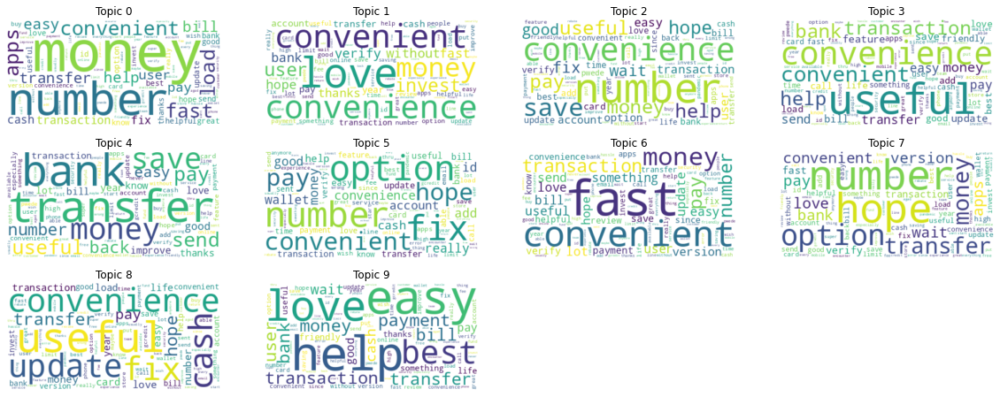

In [135]:
import matplotlib.pyplot as plt

word_to_id = dict()
for i, v in enumerate(vocab_list):
    word_to_id[v] = i

limit = 25
n_col = 4
counter = 0

plt.figure(figsize=(20, 16))
for ind in range(num_topics):

    if counter >= limit:
        break

    title_str = "Topic {}".format(ind)

    # pvals = mx.nd.softmax(W[:, ind]).asnumpy()
    pvals = mx.nd.softmax(mx.nd.array(W[:, ind])).asnumpy()

    word_freq = dict()
    for k in word_to_id.keys():
        i = word_to_id[k]
        word_freq[k] = pvals[i]

    wordcloud = wc.WordCloud(background_color="white").fit_words(word_freq)

    plt.subplot(limit // n_col, n_col, counter + 1)
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.title(title_str)
    # plt.close()

    counter += 1